# MDS Analysis

We chose MDS to project the high dimentional data into low dimention. We used the euclidean distance as the distance metric. 


**Why MDS?**

There are other approaches to project the data into low dimention, such as PCA, t-SNE, etc. We chose MDS because it aims to preserve the pairwise distances or dissimilarities between data points in the lower-dimensional space, which is what we want to achieve in this project. PCA aims to maximize the variance of the data, which is not what we want. t-SNE is better for visualization.

## Prepare data

We first need to compuate the average distances for each object pair

In [1]:
import pandas as pd

survey_df = pd.read_csv("../data/survey.csv")
uids = set(survey_df["uid"])
len(uids)

97

In [2]:
# Read trail data
data = pd.read_csv("../data/trial.csv")
data = data[data["uid"].isin(uids)]
len(data)

9328

In [3]:
# Normalize the position, the canvas size is 1000 x 600
data["x"] = data["x"] / 1000
data["y"] = data["y"] / 600

In [4]:
import numpy as np
from collections import defaultdict

# distances maps from object id pair to a list of distances
# e.g., distances[(1, 2)] = [0.1, 0.2, 0.3]
distances = defaultdict(list)

for uid in uids:
    # Get data of this participant
    uid_data = data[data["uid"] == uid]

    for trial in range(1, 7):
        # Get data of this trial
        trial_data = uid_data[uid_data["trial_id"] == trial]
        records = trial_data.to_dict("records")

        for i in range(len(records)):
            for j in range(i + 1, len(records)):
                # Get object pair tuple, make sure the smaller id is always first
                object_pair = (records[i]["object_id"], records[j]["object_id"])

                # Skip if the object pair is the same
                # This might happen when the participant submit the same trial multiple times
                # and changed the position of some objects
                if object_pair[0] == object_pair[1]:
                    continue

                if object_pair[0] > object_pair[1]:
                    object_pair = (object_pair[1], object_pair[0])

                # Calculate the distance between object i and j
                p1 = np.array([records[i]["x"], records[i]["y"]])
                p2 = np.array([records[j]["x"], records[j]["y"]])
                distance = np.linalg.norm(p1 - p2)

                # Add the distance to the list
                distances[object_pair].append(distance)

In [5]:
# Get the average distance of each object pair
average_distances = {
    object_pair: np.mean(distances[object_pair]) for object_pair in distances
}

In [6]:
# Sanity check
assert (
    len(average_distances) == 30 * 29 / 2
), "We should have an average distance for all possible object pairs"

## Vistualize the distance

In [7]:
distance_matrix = np.zeros((30, 30))
for (i, j), d in average_distances.items():
    distance_matrix[i - 1, j - 1] = d
    distance_matrix[j - 1, i - 1] = d

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib.offsetbox import OffsetImage, AnnotationBbox

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Function to read and resize images
def read_and_resize_image(index, zoom=0.05):
    img = plt.imread(f"../objects/{index}.PNG")
    return OffsetImage(img, zoom=zoom)

def plot_heatmap(m):
    # Create a mask to hide the lower triangle, including the diagonal
    mask = np.tril(np.ones_like(m))

    # Plot the heatmap
    plt.figure(figsize=(25, 20))
    ax =sns.heatmap(m, annot=True, fmt='.2f', cmap='viridis', mask=mask)

    ax.invert_yaxis()

    for x in range(1, 31):
        ax.axvline(x, color='gray', linestyle='--', linewidth=0.5)
        ax.axhline(x, color='gray', linestyle='--', linewidth=0.5)
        ax.set_xticklabels(range(1, 31))
        ax.set_yticklabels(range(1, 31))

    # Augment x-axis labels with images
    for i in range(1, 31):
        imagebox = AnnotationBbox(
            read_and_resize_image(i),
            (0.0334 * (i-1) + 0.017, -0.05),
            frameon=False,
            xycoords="axes fraction",
            boxcoords="axes fraction",
        )
        ax.add_artist(imagebox)

    # Augment y-axis labels with images
    for i in range(1, 31):
        imagebox = AnnotationBbox(
            read_and_resize_image(i),
            (-0.05, 0.0333 * (i-1) + 0.02),
            frameon=False,
            xycoords="axes fraction",
            boxcoords="axes fraction",
        )
        ax.add_artist(imagebox)

    plt.show()

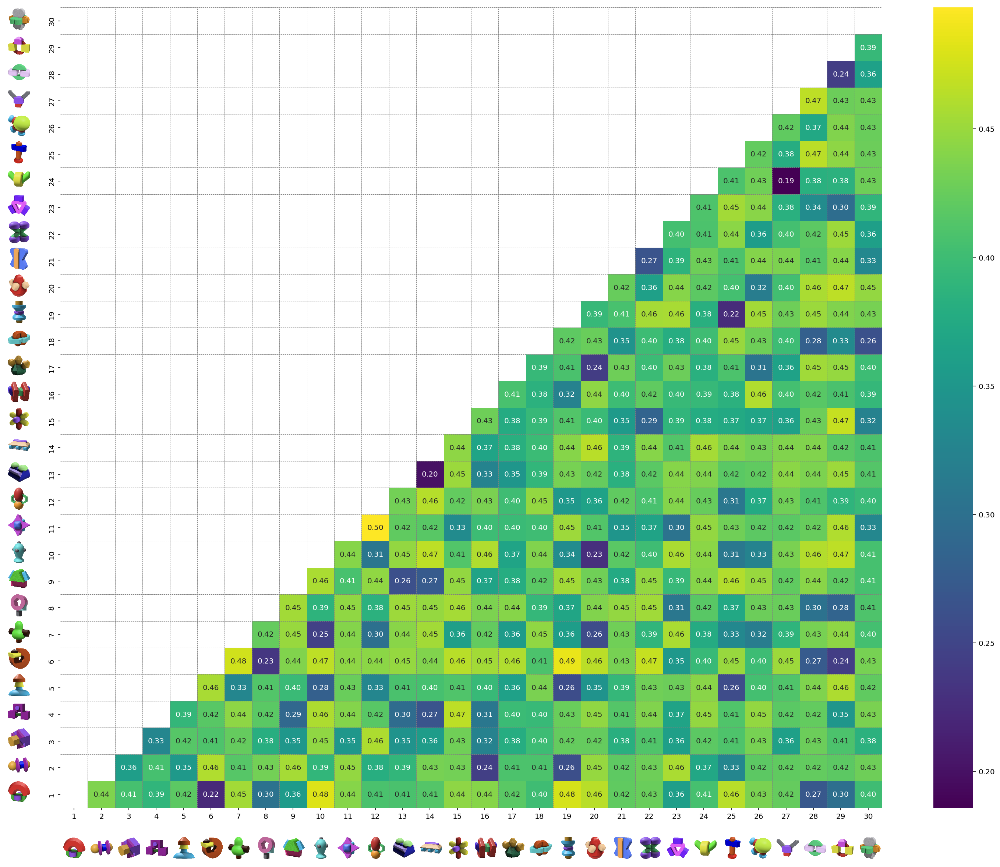

In [9]:
plot_heatmap(distance_matrix)

## MDS

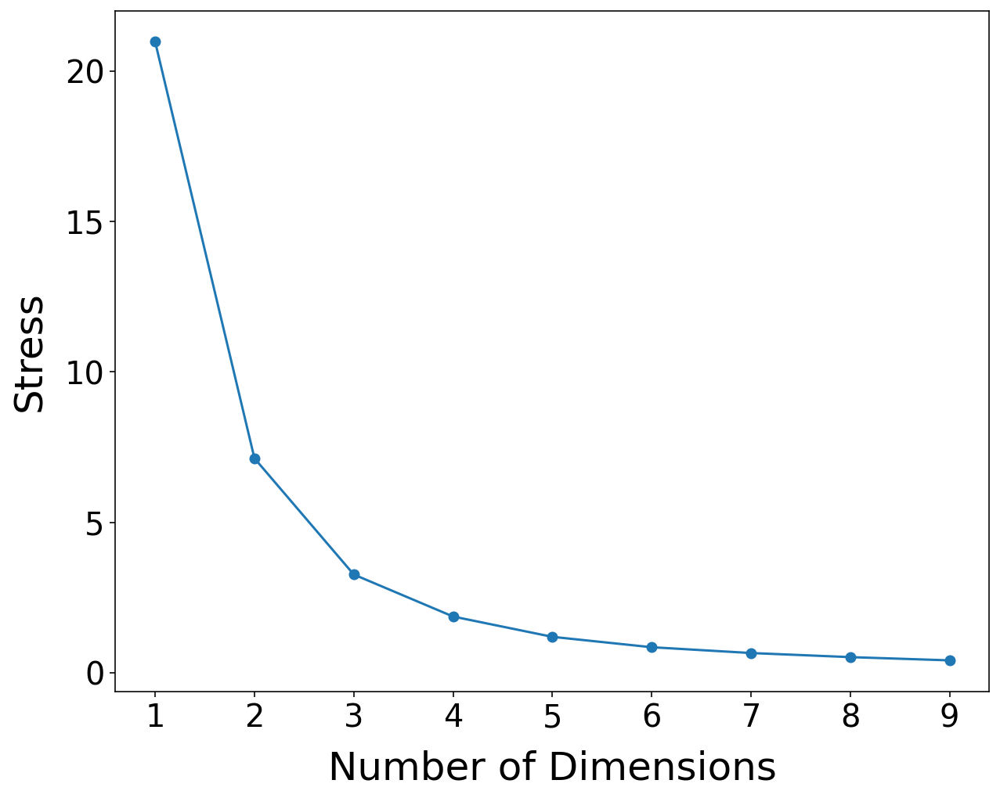

In [10]:
from sklearn.manifold import MDS

# Make a scree plot using different number of components
stress = []
for n in range(1, 10):
    embedding = MDS(
        n_components=n, dissimilarity="precomputed", n_init=100, random_state=42
    )
    X_transformed = embedding.fit_transform(distance_matrix)
    stress.append(embedding.stress_)


plt.figure(figsize=(10, 8))
plt.plot(range(1, 10), stress, marker="o")

plt.xlabel("Number of Dimensions", fontsize=25, labelpad=10)
plt.ylabel("Stress", fontsize=25, labelpad=10)

plt.xticks(fontsize=20)
_ = plt.yticks(fontsize=20)

In [11]:
# Try to find the elbow point using the Needle method
# https://raghavan.usc.edu//papers/kneedle-simplex11.pdf

from kneed import KneeLocator

kneedle = KneeLocator(range(1, 10), stress, curve="convex", direction="decreasing")
best_k = kneedle.knee
best_k

3

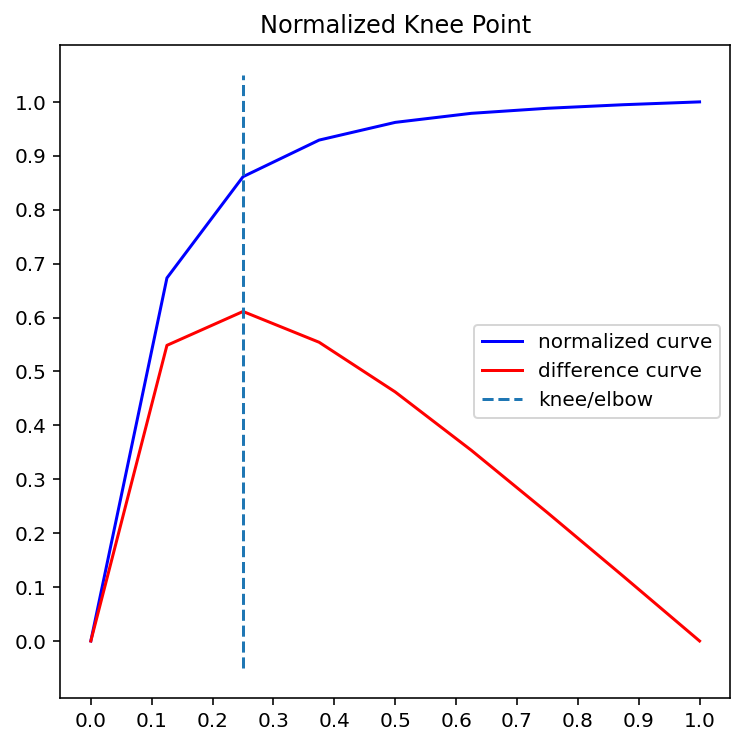

In [12]:
kneedle.plot_knee_normalized()

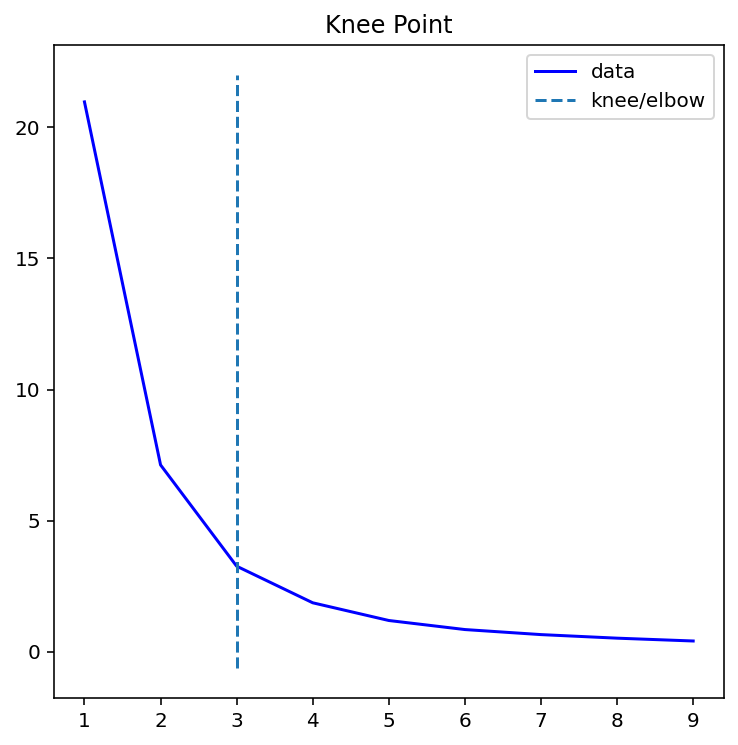

In [13]:
kneedle.plot_knee()

In [14]:
embedding = MDS(
    n_components=best_k, dissimilarity="precomputed", n_init=100, random_state=42
)
object_embeddings = embedding.fit_transform(distance_matrix)

## Rank by MDS distance

Rank the object pair similairty by the MDS distance

In [15]:
mds_distance_matrix = np.zeros((30, 30))
mds_distance_by_object_pair = {}

for i in range(30):
    for j in range(30):
        p1 = object_embeddings[i]
        p2 = object_embeddings[j]
        mds_distance_matrix[i, j] = np.linalg.norm(p1 - p2)

        if i < j:
            mds_distance_by_object_pair[(i + 1, j + 1)] = mds_distance_matrix[i, j]

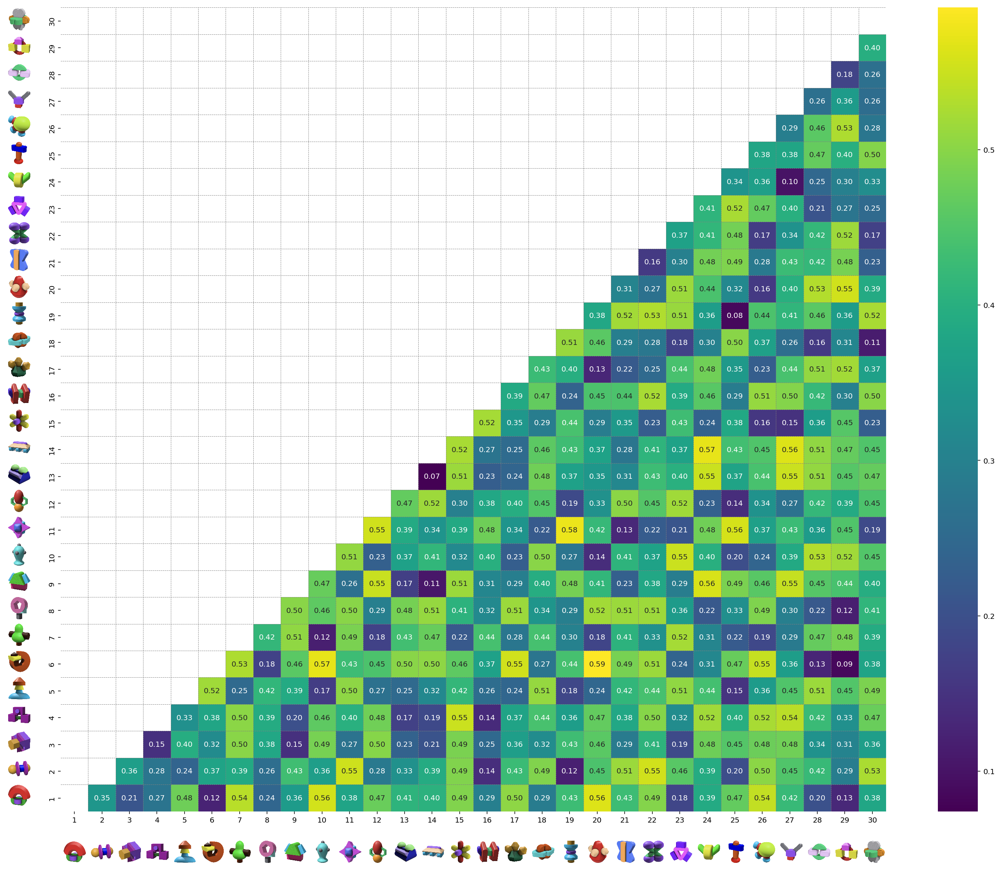

In [16]:
plot_heatmap(mds_distance_matrix)

In [17]:
from itertools import combinations


def get_ranking(distance_by_object_pair):
    sorted_distances = sorted(distance_by_object_pair.items(), key=lambda x: x[1])
    sorted_pairs = [pair for pair, _ in sorted_distances]
    pair_combinations = list(combinations(range(1, 31), 2))
    ranking = [sorted_pairs.index(pair) + 1 for pair in pair_combinations]
    return ranking

In [18]:
mds_ranking = get_ranking(mds_distance_by_object_pair)

## Plot MDS Embedding

In [19]:
from PIL import Image

images = [Image.open(f"../objects/{i}.PNG") for i in range(1, 31)]

In [20]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

# plot points using the first two dimensions
# center the coordinates so that the origin is in the middle


def plot_dimensions(dim1, dim2):
    fig, ax = plt.subplots(figsize=(20, 20))

    for i in range(30):
        imagebox = OffsetImage(images[i], zoom=0.1)  # Adjust the zoom level for size
        x = object_embeddings[i, dim1]
        y = object_embeddings[i, dim2]
        ab = AnnotationBbox(imagebox, (x, y), frameon=False)
        ax.add_artist(ab)

    plt.axhline(0, color="black", linewidth=0.5)
    plt.axvline(0, color="black", linewidth=0.5)

    plt.xlim(-0.3, 0.3)
    plt.ylim(-0.3, 0.3)

    plt.tight_layout()

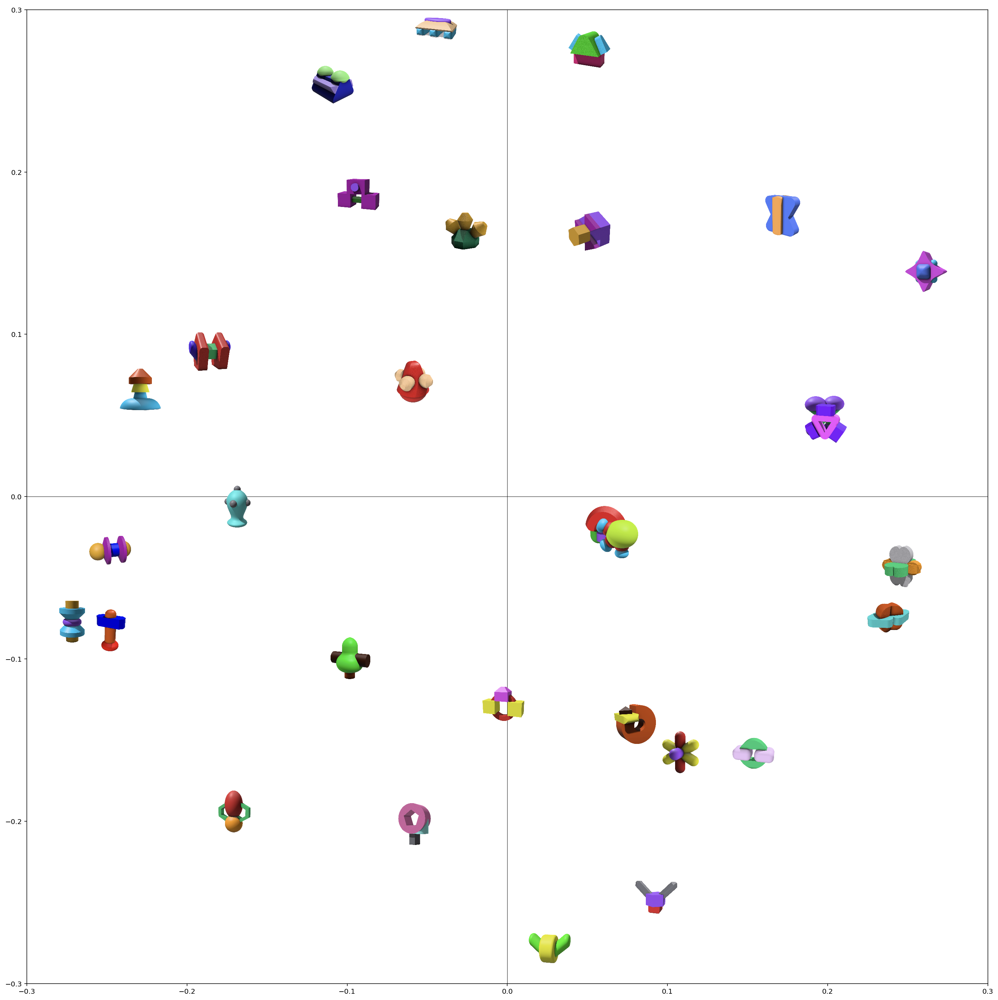

In [21]:
plot_dimensions(0, 1)

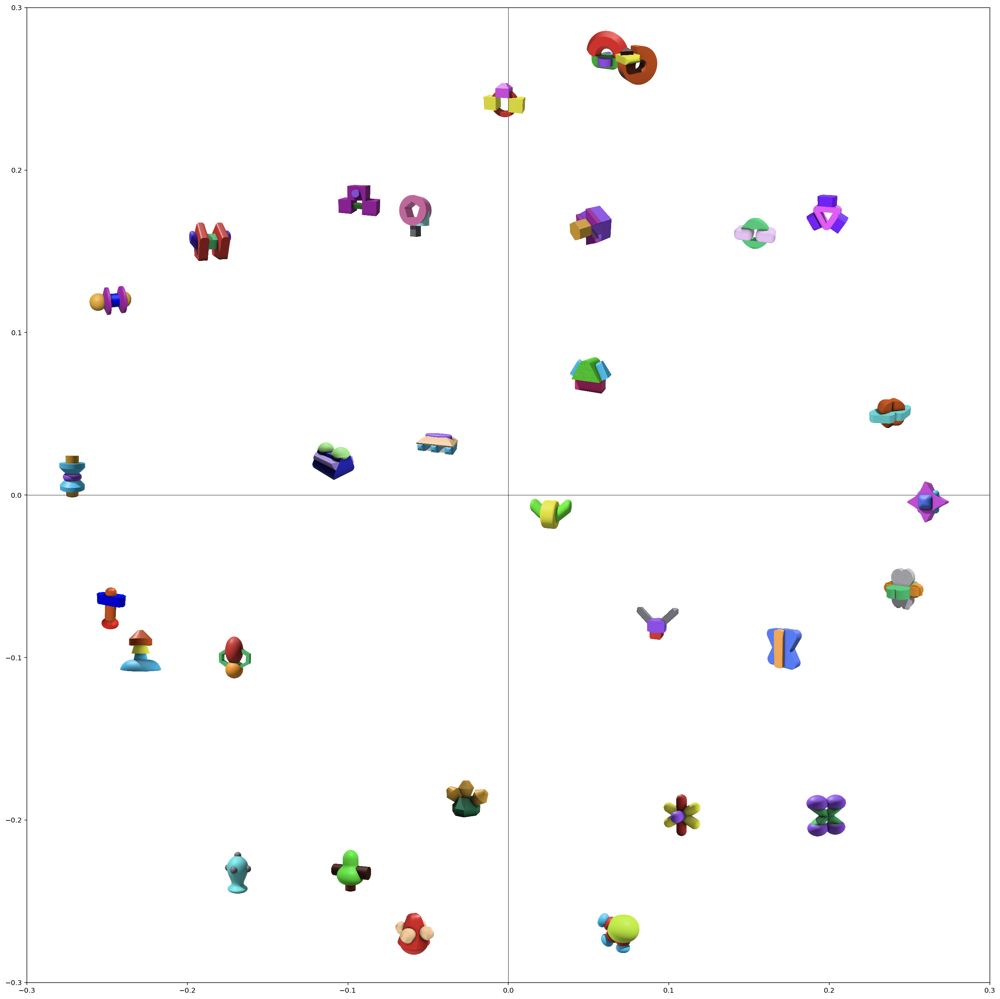

In [22]:
plot_dimensions(0, 2)

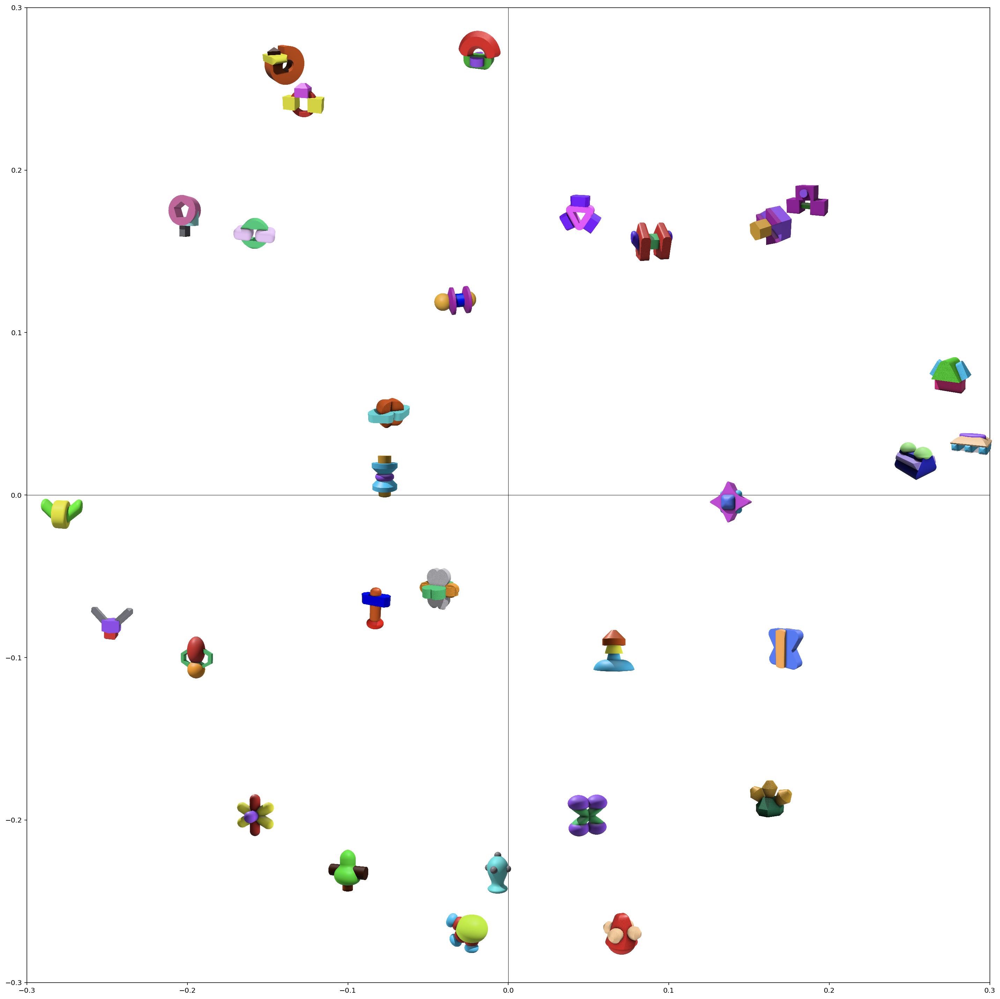

In [23]:
plot_dimensions(1, 2)

In [24]:
embedding_and_images = list(zip(object_embeddings, images))

In [25]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox


def plot_single_dimensions(dim1):
    fig, ax = plt.subplots(figsize=(20, 8))
    existing_x = []
    max_y = 0
    min_x, max_x = 0, 0

    sorted_embedding_and_images = sorted(embedding_and_images, key=lambda x: x[0][dim1])

    for embedding, image in sorted_embedding_and_images:
        imagebox = OffsetImage(image, zoom=0.1)  # Adjust the zoom level for size
        current_x = embedding[dim1]

        min_x = min(min_x, current_x)
        max_x = max(max_x, current_x)

        # Decide y
        # count the number of existing x that is close, in which case we move the image up to avoid overlap
        def count_close_x(x, existing_x, threshold=0.02):
            sorted_x = sorted(existing_x)

            # Find the place to insert the enw x
            i_for_x = 0
            while i_for_x < len(sorted_x) and sorted_x[i_for_x] < x:
                i_for_x += 1

            # Insert the new x
            sorted_x.insert(i_for_x, x)

            cnt = 0
            i = i_for_x
            while i > 0 and sorted_x[i] - sorted_x[i - 1] <= threshold:
                cnt += 1
                i -= 1

            i = i_for_x
            while i < len(sorted_x) - 1 and sorted_x[i + 1] - sorted_x[i] <= threshold:
                cnt += 1
                i += 1

            return cnt

        y = 0.05 * count_close_x(current_x, existing_x) - 0.05
        max_y = max(max_y, y)

        existing_x.append(current_x)

        ab = AnnotationBbox(imagebox, (current_x, y), frameon=False)
        ax.add_artist(ab)

        # draw a vertical dash line from the image to the x axis
        plt.plot(
            [current_x, current_x],
            [y, -0.2],
            color="gray",
            linestyle="--",
            linewidth=0.8,
        )

    plt.xlim(min_x - 0.02, max_x + 0.02)
    plt.ylim(-0.1, max_y + 0.1)
    plt.yticks([])

    plt.tight_layout()

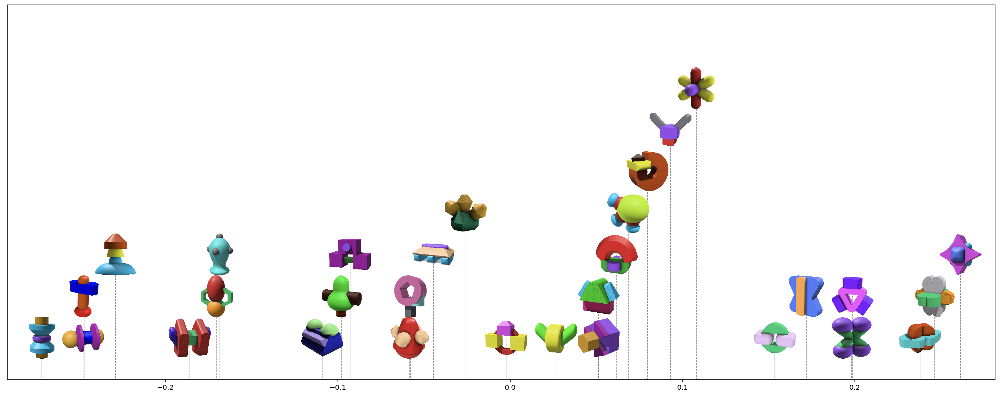

In [26]:
plot_single_dimensions(0)

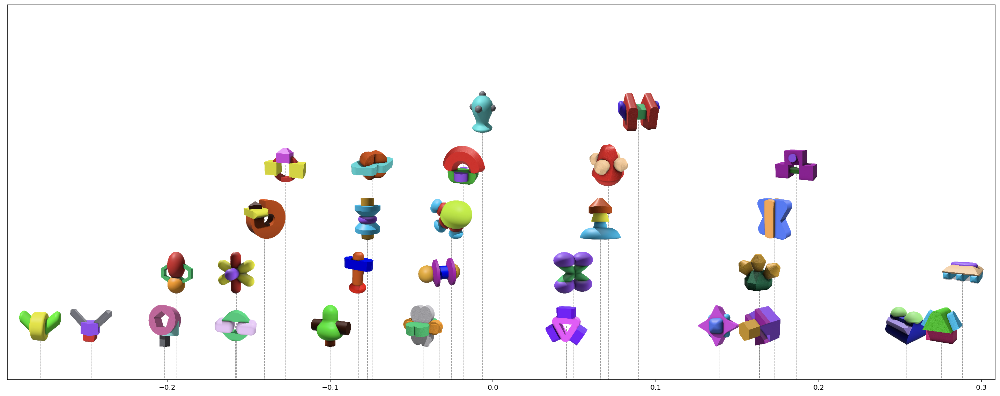

In [27]:
plot_single_dimensions(1)

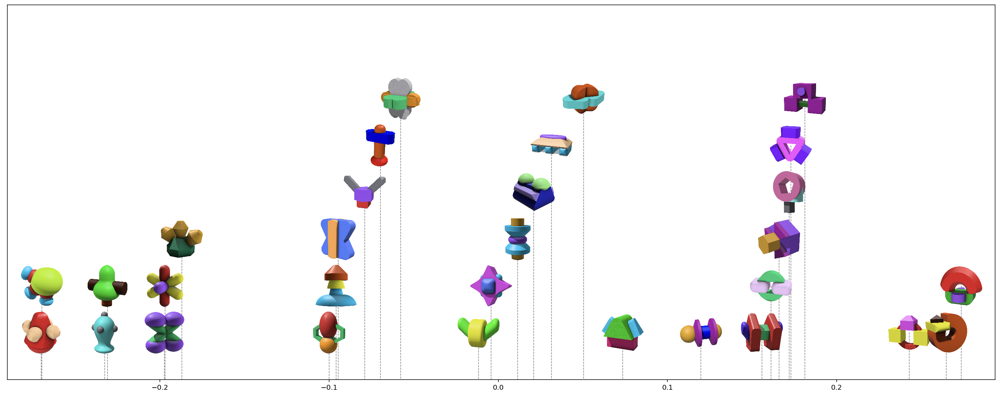

In [28]:
plot_single_dimensions(2)

## Quartiles

Based on the ranking, we can divide the object pairs into 4 quartiles. The following function computes the stats of each quartile and display an example from each quartile.

In [29]:
import random
import math

import random
import math


def compute_quartile_stats(mds_ranking, distance_by_object_pair):
    pair_combinations = list(combinations(range(1, 31), 2))
    rank_by_pair = dict(zip(pair_combinations, mds_ranking))

    n_pairs = len(mds_ranking)
    quartile = math.ceil(n_pairs / 4)

    for q in range(4):
        all_quartile_pairs = [
            (pair, rank) for pair, rank in rank_by_pair.items() if rank // quartile == q
        ]

        ranks = [rank for _, rank in all_quartile_pairs]

        # Compute stats
        print()
        print(f"Quartile {q+1}:")

        # Get all distances
        all_distances = [
            distance_by_object_pair[pair] for pair, _ in all_quartile_pairs
        ]
        print(f"Mean distance: {np.mean(all_distances):.4f}")
        print(f"Standard deviation: {np.std(all_distances):.4f}")
        print(
            f"Distance range: {np.min(all_distances):.4f} - {np.max(all_distances):.4f}"
        )
        print(
            f"Rank range: {min(ranks)} - {max(ranks)}",
        )

In [30]:
compute_quartile_stats(mds_ranking, mds_distance_by_object_pair)


Quartile 1:
Mean distance: 0.2062
Standard deviation: 0.0542
Distance range: 0.0741 - 0.2851
Rank range: 1 - 108

Quartile 2:
Mean distance: 0.3462
Standard deviation: 0.0338
Distance range: 0.2874 - 0.3959
Rank range: 109 - 217

Quartile 3:
Mean distance: 0.4363
Standard deviation: 0.0228
Distance range: 0.3959 - 0.4753
Rank range: 218 - 326

Quartile 4:
Mean distance: 0.5151
Standard deviation: 0.0261
Distance range: 0.4768 - 0.5914
Rank range: 327 - 435


In [31]:
def plot_example(mds_ranking, distance_by_object_pair, rank):
    pair_combinations = list(combinations(range(1, 31), 2))
    # Get the pair combination wtih the given rank
    idx = mds_ranking.index(rank)
    pair = pair_combinations[idx]
    distance = distance_by_object_pair[pair]

    n_pairs = len(mds_ranking)
    quartile = math.ceil(n_pairs / 4)
    q = rank // quartile

    # display the two images side by side
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(Image.open(f"../objects/{pair[0]}.PNG"))
    ax[0].axis("off")
    ax[0].set_title(f"Object {pair[0]}")

    ax[1].imshow(Image.open(f"../objects/{pair[1]}.PNG"))
    ax[1].axis("off")
    ax[1].set_title(f"Object {pair[1]}")

    fig.suptitle(
        f"Quartile {q+1}, rank = {rank}, distance = {distance_by_object_pair[pair]:.4f}",
        fontsize=20,
    )

    plt.show()

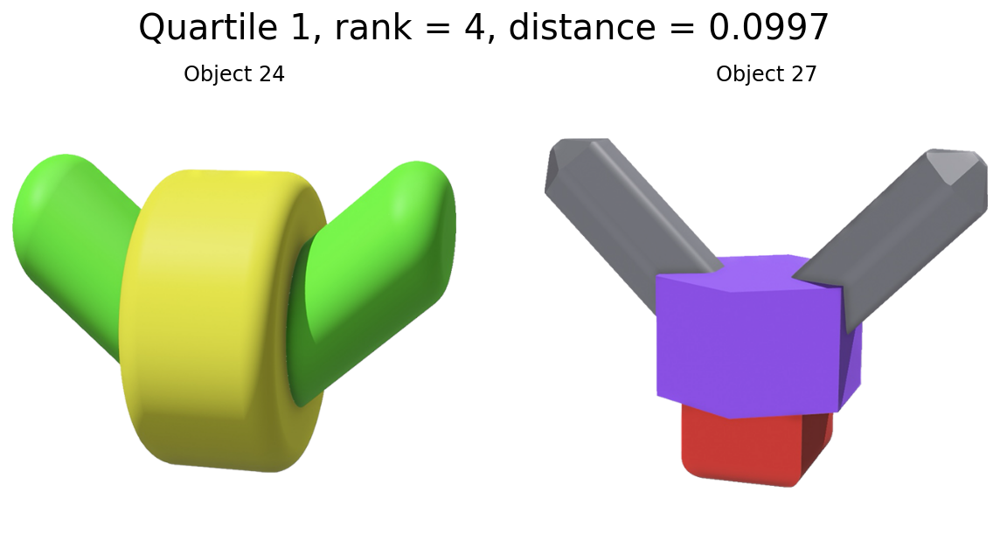

In [32]:
# Cherry pick some examples from each quartile
plot_example(mds_ranking, mds_distance_by_object_pair, 4)

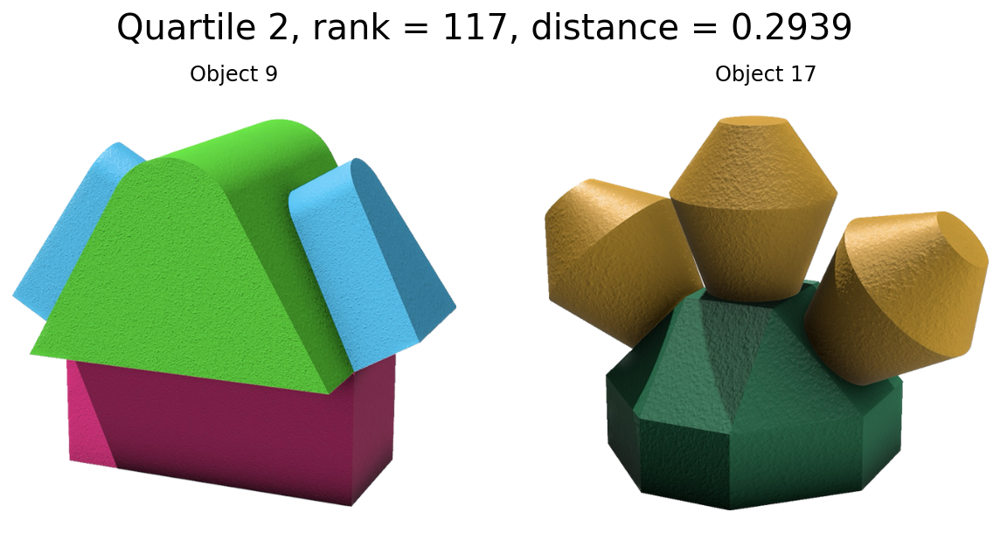

In [33]:
plot_example(mds_ranking, mds_distance_by_object_pair, 117)

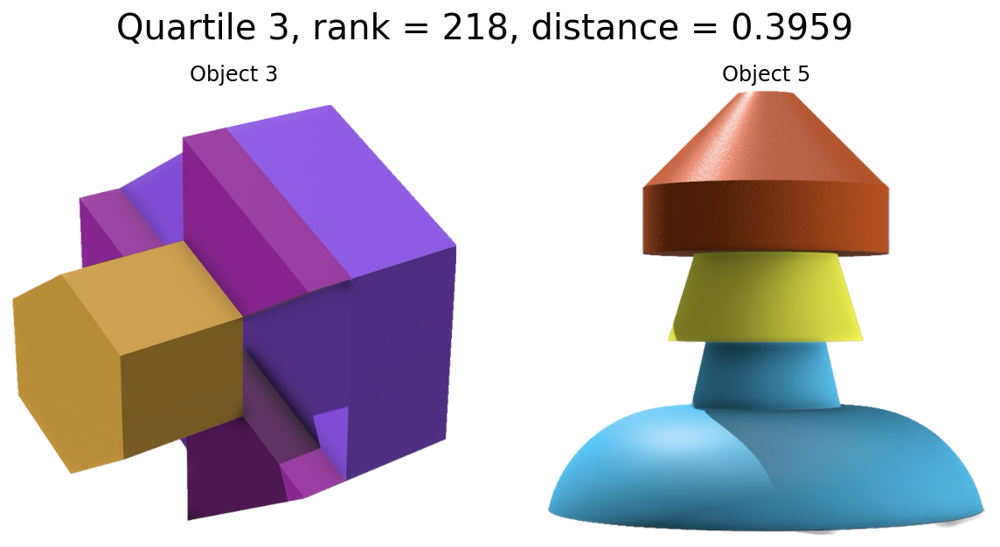

In [34]:
plot_example(mds_ranking, mds_distance_by_object_pair, 218)

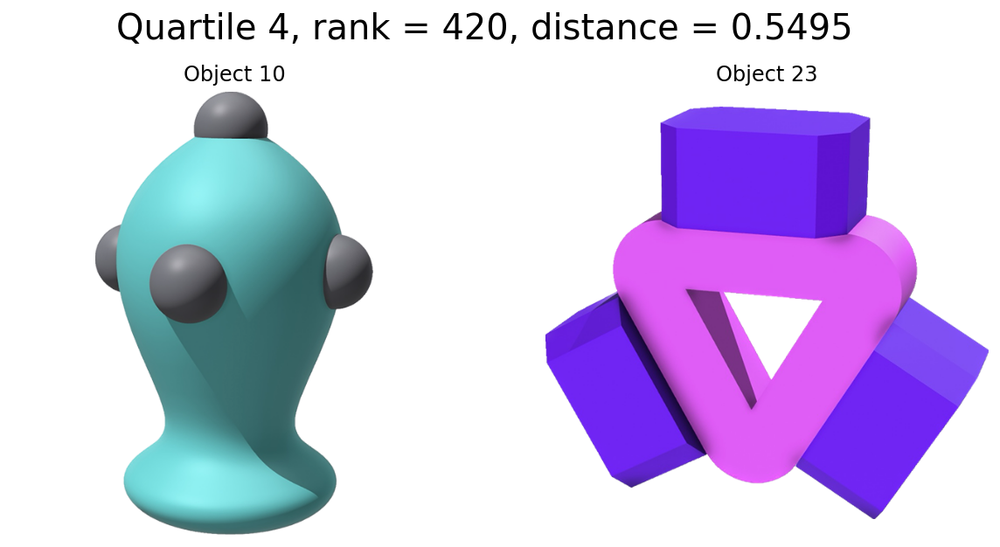

In [35]:
plot_example(mds_ranking, mds_distance_by_object_pair, 420)

## Similar to the set as a whole

In [36]:
# Compare the average distance of each object against all other objects
mean_distance_by_object = {
    obj: np.mean(
        [score for pair, score in mds_distance_by_object_pair.items() if obj in pair]
    )
    for obj in range(1, 31)
}

In [37]:
# Sort the objects by their average distance
object_mean_distances = sorted(mean_distance_by_object.items(), key=lambda x: x[1])

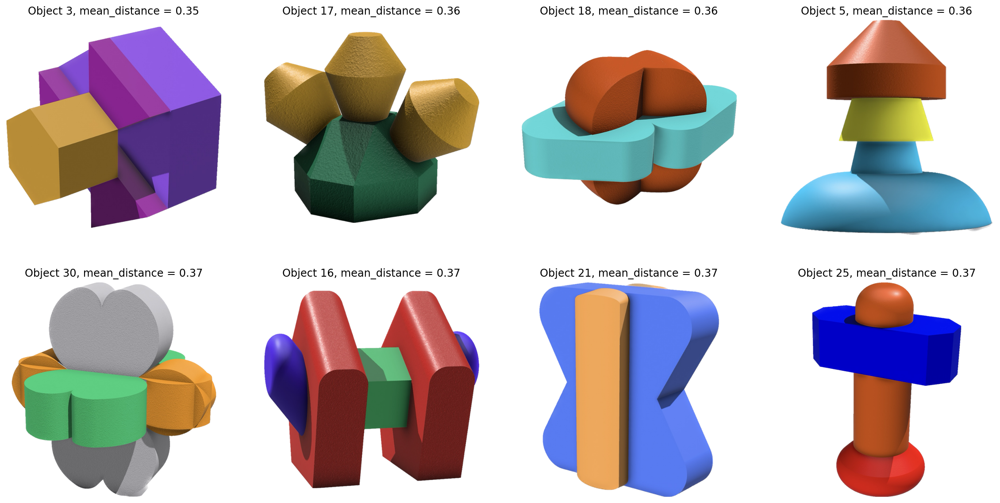

In [38]:
# Show bottom 8 objects, i.e. the objects that are closest to other objects
fig, ax = plt.subplots(2, 4, figsize=(20, 10))
for i in range(8):
    ax[i // 4, i % 4].imshow(
        Image.open(f"../objects/{object_mean_distances[i][0]}.PNG")
    )
    ax[i // 4, i % 4].axis("off")
    ax[i // 4, i % 4].set_title(
        f"Object {object_mean_distances[i][0]}, mean_distance = {object_mean_distances[i][1]:.2f}"
    )

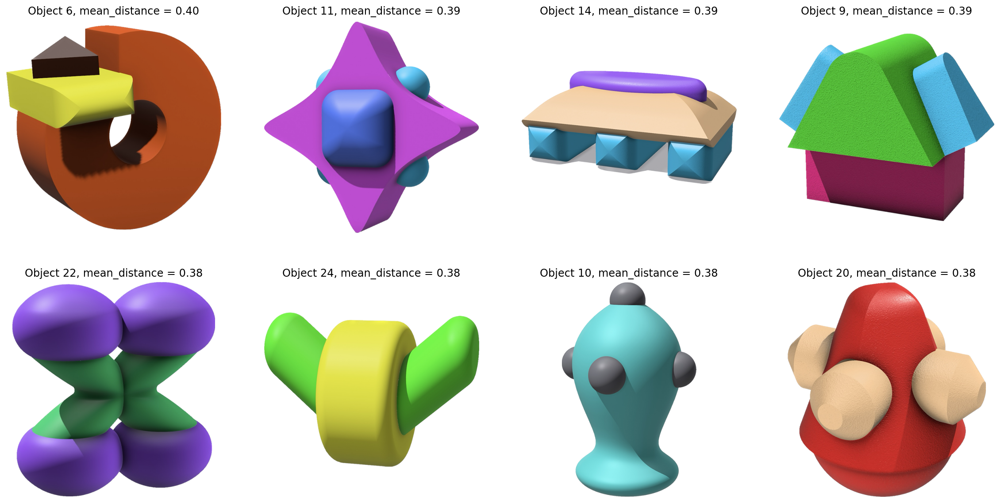

In [39]:
# Show top 8 objects, i.e. the objects that are furthest to other objects
fig, ax = plt.subplots(2, 4, figsize=(20, 10))
for i in range(8):
    ax[i // 4, i % 4].imshow(
        Image.open(f"../objects/{object_mean_distances[-i-1][0]}.PNG")
    )
    ax[i // 4, i % 4].axis("off")
    ax[i // 4, i % 4].set_title(
        f"Object {object_mean_distances[-i-1][0]}, mean_distance = {object_mean_distances[-i-1][1]:.2f}"
    )

# Find Global Categories with Clustering

In this section, we try to partition the objects into clusters based on the MDS embeddings and distance. Here we're trying both the classical clustering as well as the hierarchical clustering method.

## Simple Clustering - KMeans

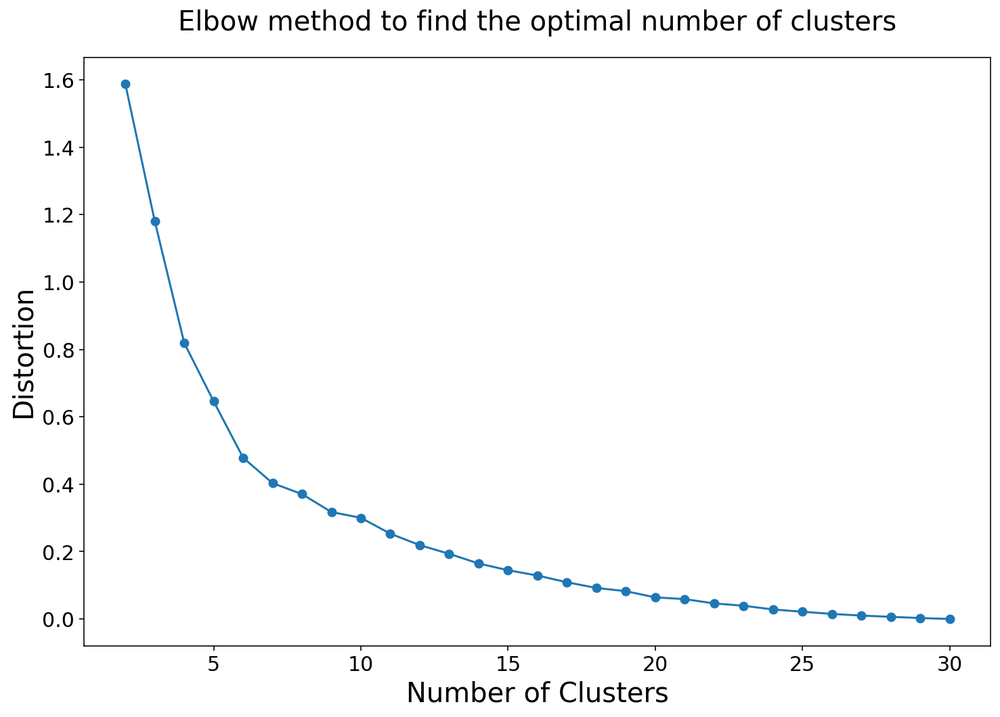

In [40]:
from sklearn.cluster import KMeans

distortions = []
for k in range(2, 31):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(object_embeddings)
    distortions.append(kmeans.inertia_)

fig = plt.figure(figsize=(12, 8))
plt.plot(range(2, 31), distortions, marker="o")
plt.xlabel("Number of Clusters", fontsize=20)
plt.ylabel("Distortion", fontsize=20)
plt.title("Elbow method to find the optimal number of clusters", fontsize=20, pad=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

In [41]:
kneedle = KneeLocator(range(2, 31), distortions, curve="convex", direction="decreasing")
best_n_clusters = kneedle.knee
best_n_clusters

7

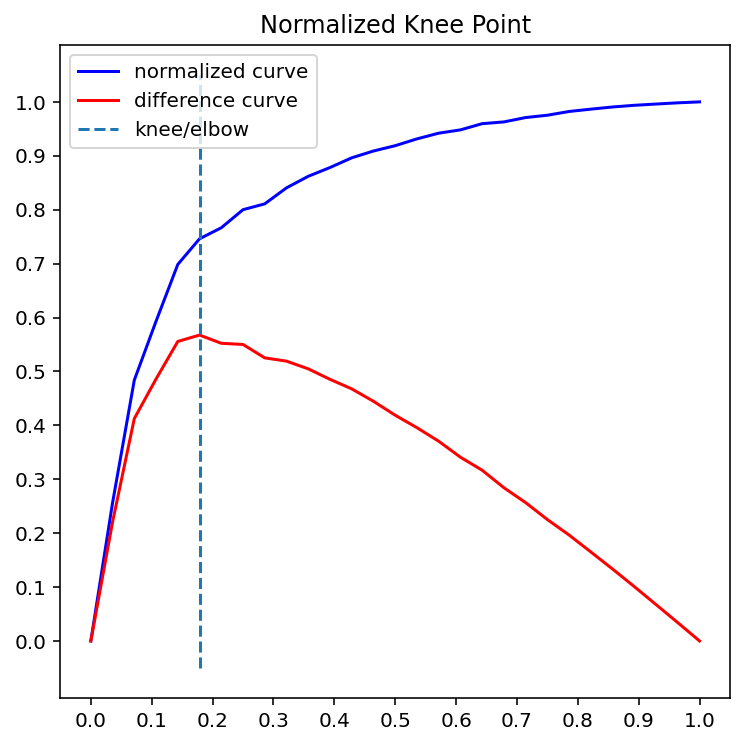

In [42]:
kneedle.plot_knee_normalized()

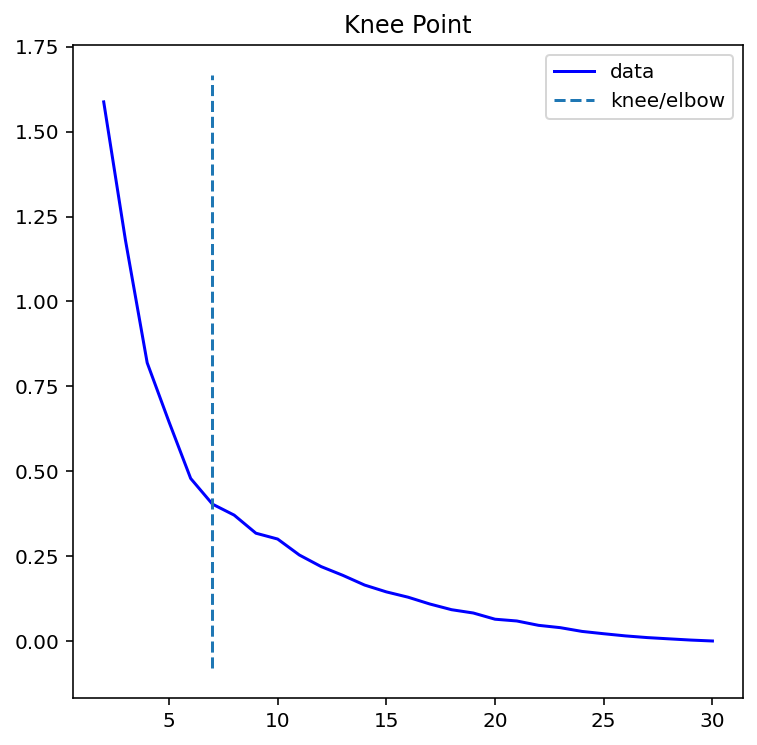

In [43]:
kneedle.plot_knee()

In [44]:
kmeans = KMeans(n_clusters=best_n_clusters, random_state=42)
kmeans.fit(object_embeddings)

KMeans(n_clusters=7, random_state=42)

In [45]:
kmeans_clusters = list(kmeans.labels_)

kmeans_categories = [set() for _ in range(best_n_clusters)]
for i, label in enumerate(kmeans_clusters):
    kmeans_categories[label].add(i + 1)

In [46]:
def draw_category(objects):
    fig, ax = plt.subplots(1, len(objects), figsize=(10, 5 * len(objects)))
    for i, obj in enumerate(sorted(objects)):
        ax[i].imshow(Image.open(f"../objects/{obj}.PNG"))
        ax[i].axis("off")
        ax[i].set_title(f"Object {obj}")
    plt.tight_layout()

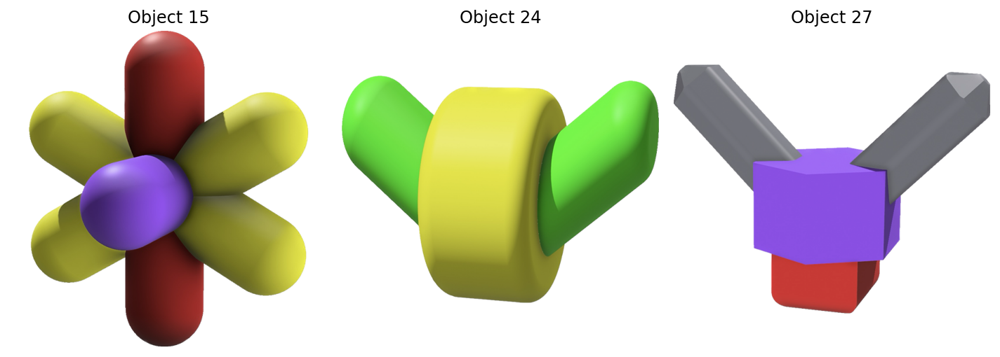

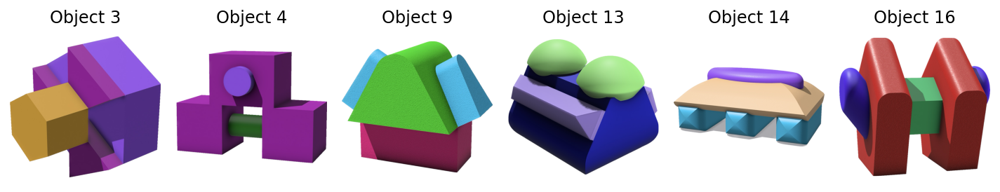

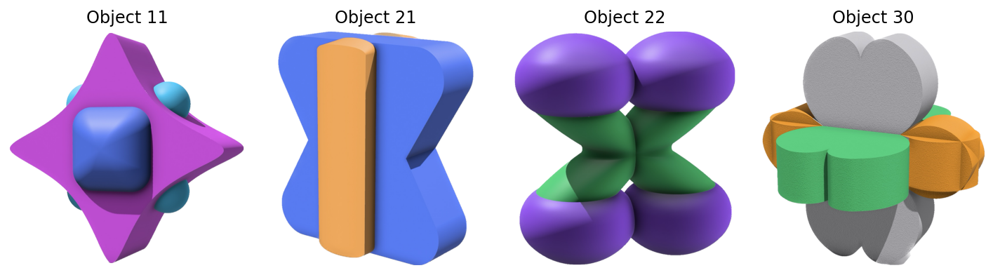

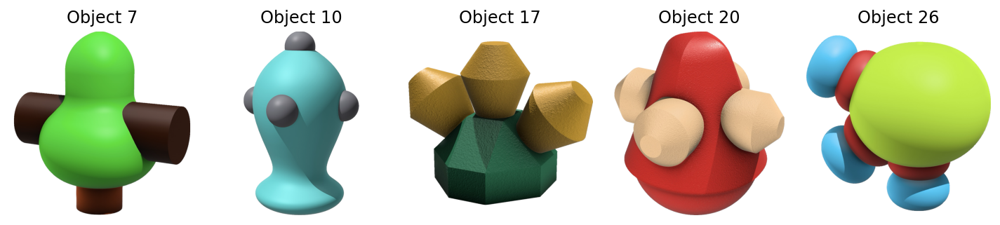

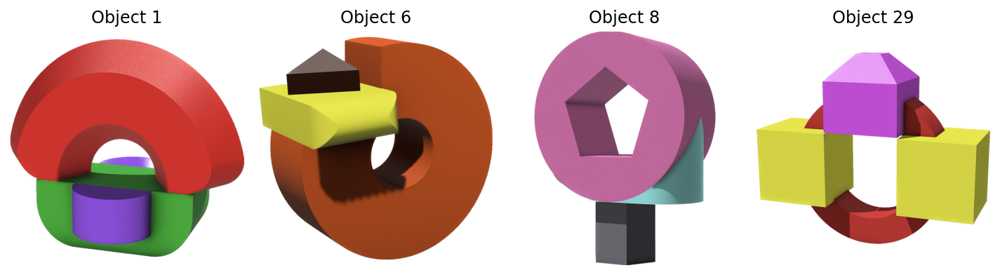

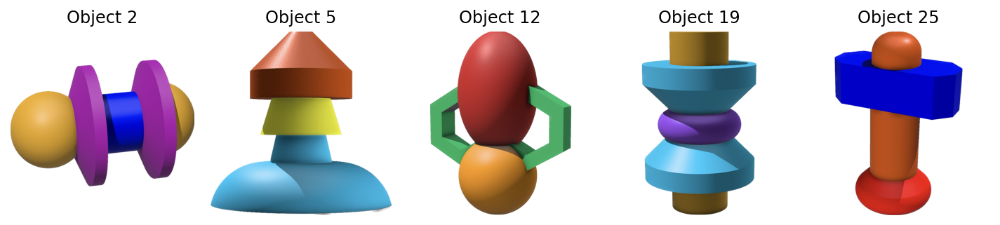

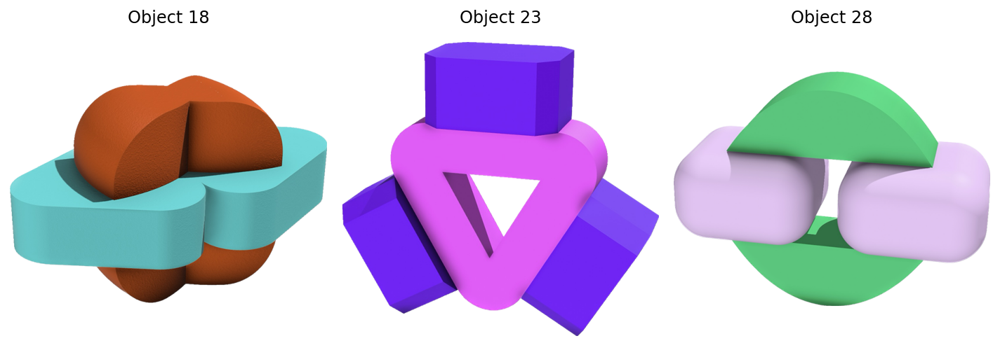

In [47]:
for c in kmeans_categories:
    draw_category(objects=c)

## Hierarchical Clustering

/var/folders/3h/16r_n_t90kg2dd10vc578fjh0000gn/T/ipykernel_65403/2051170045.py:8: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix = linkage(mds_distance_matrix, method="ward", optimal_ordering=True)


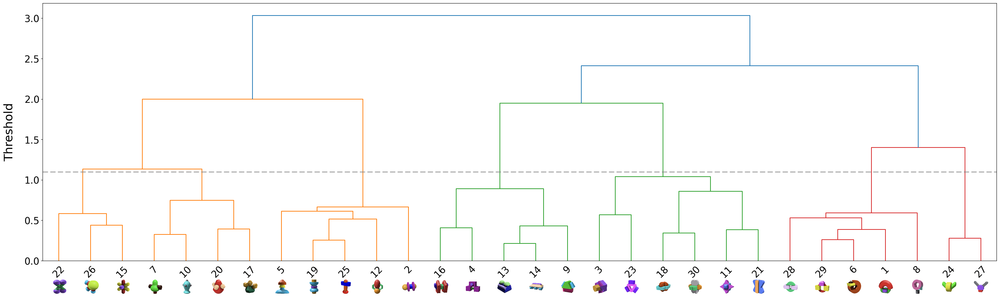

In [48]:
# Assuming 'objects' folder is in the current working directory
import os
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

# Hierarchical clustering
linkage_matrix = linkage(mds_distance_matrix, method="ward", optimal_ordering=True)
fig, ax = plt.subplots(figsize=(36, 10))

# Use image names for x-axis labels
image_names = [str(i) for i in range(1, len(object_embeddings) + 1)]
clustering_result = dendrogram(linkage_matrix, labels=image_names)

# Replace x-axis labels with images
for i, label in enumerate(clustering_result["ivl"]):
    imagebox = AnnotationBbox(
        read_and_resize_image(int(label)),
        (0.0333 * i + 0.018, -0.10),
        frameon=False,
        xycoords="axes fraction",
        boxcoords="axes fraction",
    )
    ax.add_artist(imagebox)

plt.axhline(1.1, color="gray", linestyle="--", linewidth=3.0, alpha=0.5)

# Update the axis tick size
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)


plt.ylabel("Threshold", fontsize=25, labelpad=20)

plt.show()

In [49]:
from scipy.cluster.hierarchy import fcluster

threshold = 1.1
linkage_clusters = fcluster(linkage_matrix, threshold, criterion="distance")
linkage_clusters = [
    l - 1 for l in linkage_clusters
]  # offset by 1 to be consistent with other clustering results

In [50]:
linkage_categories = [set() for _ in range(max(linkage_clusters) + 1)]
for i, label in enumerate(linkage_clusters):
    linkage_categories[label].add(i + 1)

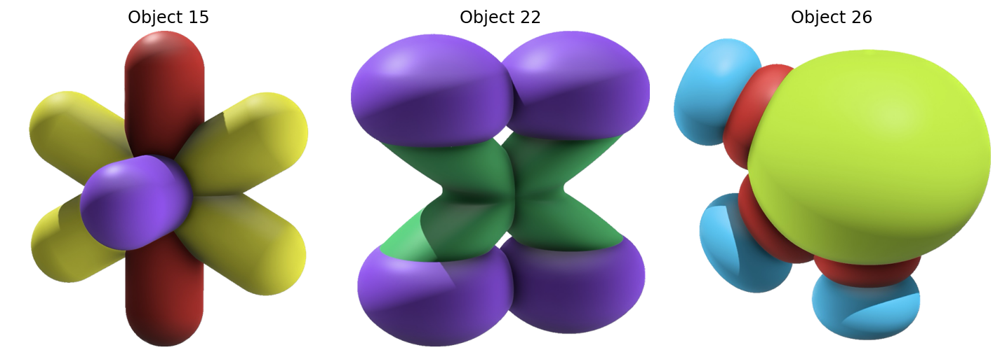

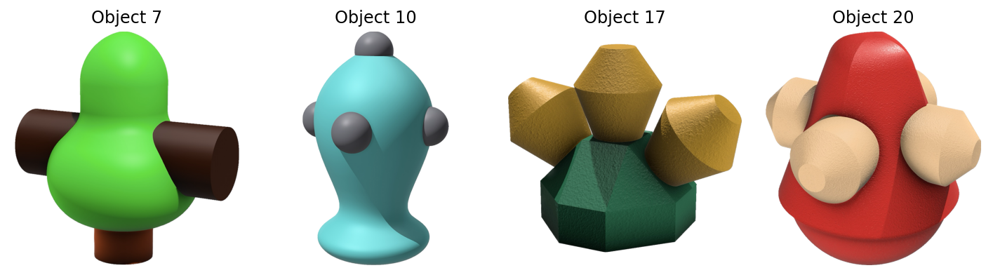

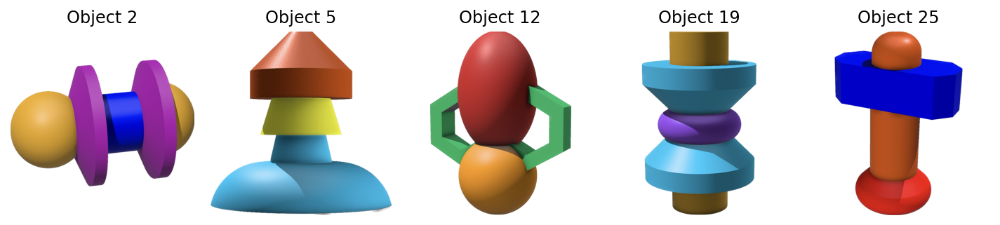

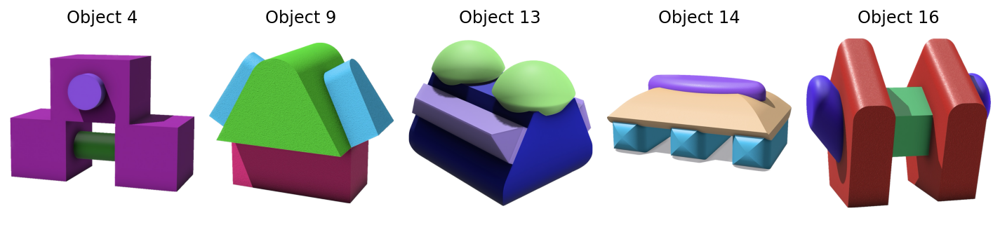

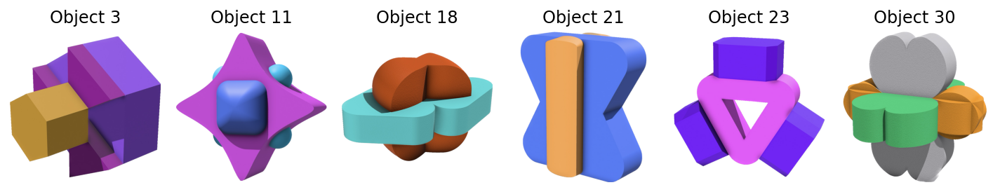

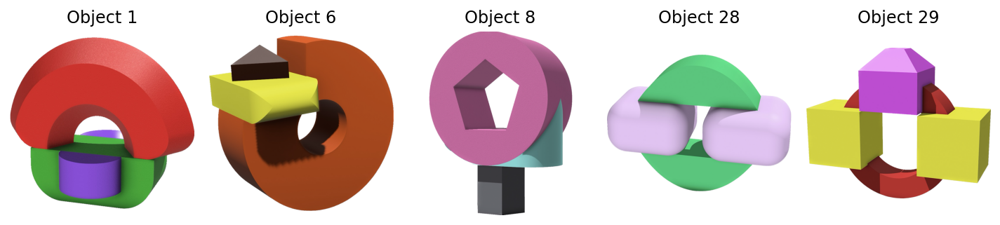

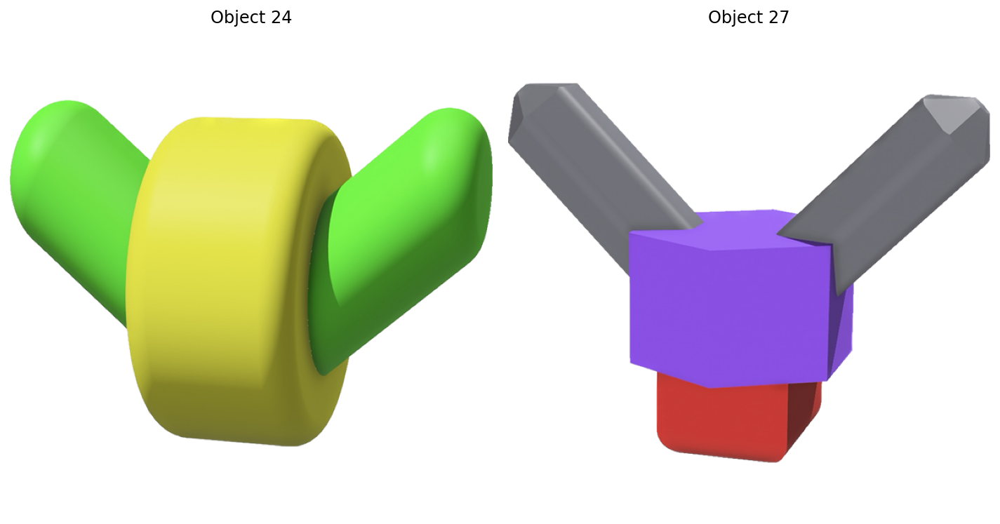

In [51]:
for c in linkage_categories:
    draw_category(objects=c)

# Clustering Agreement

Here we'd like to measure the agreement between the two clustering methods. We use the Adjusted Rand Index (ARI) to measure the agreement between two clustering methods. The ARI is a measure of the similarity between two clustering results. It considers all pairs of samples and counts pairs that are assigned in the same or different clusters in the predicted and true clusters.

In [52]:
from sklearn.metrics import adjusted_rand_score

ari = adjusted_rand_score(kmeans_clusters, linkage_clusters)
print(f"ARI: {ari:.4f}")

ARI: 0.6406
